# <center> Lab 2 Examples 
## <center>    Surfaces of Revolution and Length
    
In this Lab, you will have to write your own def file to approximate integrals through Riemann Sums, similar to LeftBox and RightBox in the previous lab. In the examples file, we will do this for a surface of revolution using washer method. 

**Video:** https://youtu.be/X_BCWOtaamE

We start with importing needed libraries.

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import sympy as sp
from numpy.polynomial import *
sp.var('x')


x

Let's write a function that finds volume of a surface of revolution with respect to $x$-axis using washer method and then plots corresponding bar chart of a Riemann sum. Recall, that given $f(x) \ge g(x)$ and interval $[a,b]$, the volume of revolution surface bounded by $f(x)$ and $g(x)$ bertween $a$ and $b$ is given by:
$$V=\pi \int_a^b (f^2(x)-g^2(x))dx.$$

Since for Riemann sum it is not very important which point in each partition we pick, we will use left points in all of our examples. We will call this function `WasherVol`. It will accept higher function $f$, lower function $g$, lower bound $a$, upper bound $b$ and number of partitions $n$.

Note the new parameter `bottom` in the `bar` command. It specifies where the bottom of each bar starts. 

In [2]:
def WasherVol(fn,gn,a,b,n):
    
    
    # Compute approximation of the Volume
    delx=(b-a)/n
    xi = np.arange(a, b, delx)
    volume=np.pi*np.sum(fn(xi)**2-gn(xi)**2)*delx     # this is our computation of the Riemann Sums that approximates the volume
    
    # Plot the f(x) and g(x)
    fig=plt.figure()
    xVals = np.linspace(a, b, 1000)
    plt.plot(xVals, fn(xVals))
    plt.plot(xVals, gn(xVals))
    
    # Plot the bar chart
    plt.bar(xi, fn(xi) - gn(xi), width = delx, bottom = gn(xi),
            alpha=0.2, edgecolor='blue', align='edge')
    
    # Plot axis of revolution
    plt.hlines(0, a, b, colors = 'grey', linestyles = 'dashed')
    
    plt.title("Approximation of the Area Bounded by f(x) and g(x)")
    plt.show()
    
    print("Volume = ", volume)

Let's check how it works on the example.

Let $f(x)=x^2$ and $g(x)=e^{-x}$. Let's approximate the volume of the surface of revolution bounded by $f(x)$ and $g(x)$ between $x=1$ and $x=2$ using $n=10$. Note that on interval $[1,2]$, $f(x)\ge g(x)$.

In [3]:
f= x**2
g=sp.exp(-x)

fn=sp.lambdify(x,f,'numpy')
gn=sp.lambdify(x,g,'numpy')

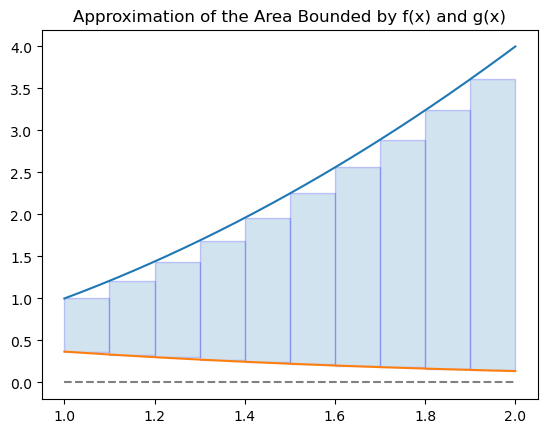

Volume =  16.992165583079668


In [4]:
WasherVol(fn,gn,1,2,10)

Now let's try this again with $n=100$ and then also calculate the actual integral.

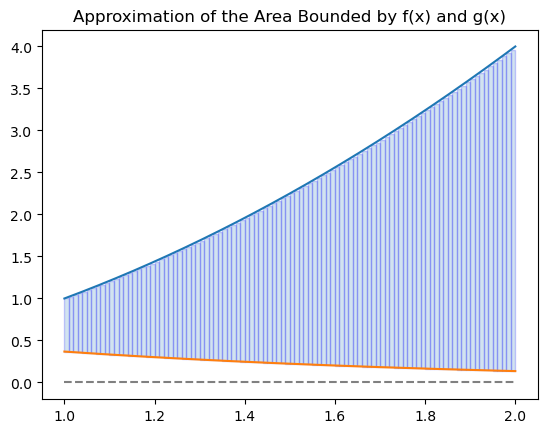

Volume =  19.057329745603216


In [5]:
WasherVol(fn, gn, 1,2,100)

In [6]:
sp.N(sp.integrate(sp.pi*(f**2-g**2),(x,1,2)))

19.2940604247522

We can also plot a 3-D projection of this surface. It is somewhat complicated code, we need to use meshgrid. Here is an example of it. Few things to help you understand the code:

1. $u$ is the our interval $[a,b]$ and $v$ represents rotation around our axis of rotation.

2. $X,Y1, Z1$ is inner surface created by $g$; $X, Y2, Z2$ is outer surface created by $f$.

3. Command `plot_surface` plots surface (`alpha=0.3` makes it transparent) ; command `plot_wireframe` plots grid on our surface.

In [7]:
def Washer3D(fn,gn,a,b):
    
    fig = plt.figure()
    ax = fig.add_subplot(1, 1, 1, projection='3d')

    u = np.linspace(a, b, 60)
    v = np.linspace(0, 2*np.pi, 60)
    U, V = np.meshgrid(u, v)

    X = U
    Y1 = (gn(U))*np.cos(V)
    Z1 = (gn(U))*np.sin(V)

    Y2 = (fn(U))*np.cos(V)
    Z2 = (fn(U))*np.sin(V)

    ax.plot3D([a,b], [0,0], [0,0], alpha=1, color='black')                     # axis of rotation.
    
    ax.plot_surface(X, Y1, Z1, alpha=0.3, color='red', rstride=6, cstride=12)
    ax.plot_surface(X, Y2, Z2, alpha=0.3, color='blue', rstride=6, cstride=12)
    ax.plot_wireframe(X, Y1, Z1, alpha=0.3, color='red', rstride=4, cstride=8)
    ax.plot_wireframe(X, Y2, Z2, alpha=0.3, color='blue', rstride=4, cstride=8)
    
    ax.set_xlim(1,2)
    ax.set_ylim(-6,6)
    ax.set_zlim(-6,6)
    
    ax.view_init(0,-60,0)
    
    plt.show()

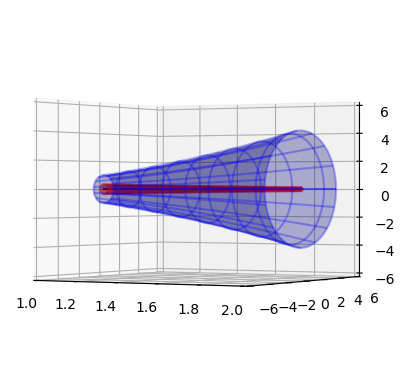

In [8]:
Washer3D(fn,gn,1,2)

If you need to plot just one surface of revolution and you don't want to create a new command, then you can just make $g(x)=0$. We will use this opportunity to introduce another way of defining functions. So far, we would always create SymPy function and then lambdify to the NumPy type function. This is because we usually need both. However, here we only need NumPy type. We can use `def` to define NumPy function, but if your function has a simple expression, it is faster to use `lambda` command: 

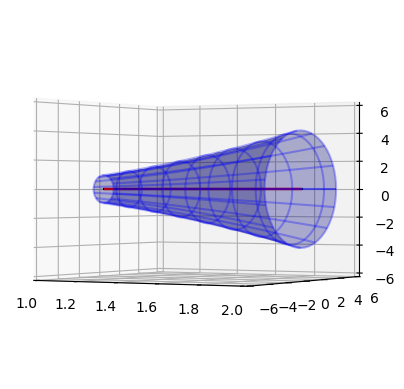

In [9]:
g=lambda x:0        # this means g(x)=0.
Washer3D(fn,g,1,2)

We can modify our `WasherVol` function to take care of rotations around any horizontal axis. Recall, the formula for this is

$$V=\pi \int_a^b \left[(f(x)-c)^2-(g(x)-c)^2\right]dx,$$
where $x=c$ is the axis of rotation.
It is quite easy to do. We only need to change 3 things: need to give our function axis of rotation, calculation of the volume and plotting correct axis of rotation.

In [10]:
def WasherVol2(fn,gn,a,b,axis,n):
    
    # Compute approximation of the Volume
    delx=(b-a)/n
    xi = np.arange(a, b, delx)
    volume=np.pi*np.sum((fn(xi)-axis)**2-(gn(xi)-axis)**2)*delx     # here we need to shift our functions
    
    # Plot the f(x) and g(x)
    fig=plt.figure()
    xVals = np.linspace(a, b, 1000)
    plt.plot(xVals, fn(xVals))
    plt.plot(xVals, gn(xVals))
    
    # Plot the bar chart
    plt.bar(xi, gn(xi) - fn(xi), width = delx, bottom = fn(xi),
            alpha=0.2, edgecolor='blue', align='edge')
    
    # Plot axis of revolution
    plt.hlines(axis, a, b, colors = 'grey', linestyles = 'dashed')   # axis of rotation
    
    plt.title("Approximation of the Area Bounded by f(x) and g(x)")
    plt.show()
    
    print("Volume = ", volume)

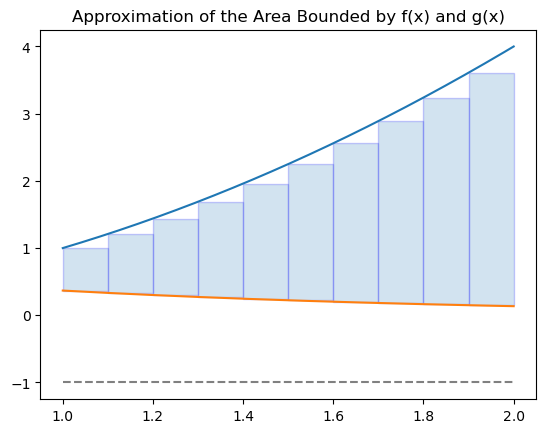

Volume =  29.185534145561252


In [11]:
WasherVol2(fn,gn,1,2,-1,10)

In [22]:
def Washer3D2(fn,gn,a,b, axis):

    fig = plt.figure()
    ax = fig.add_subplot(1, 1, 1, projection='3d')

    u = np.linspace(a, b, 60)
    v = np.linspace(0, 2*np.pi, 60)
    U, V = np.meshgrid(u, v)

    X = U
    Y1 = (gn(U)-axis)*np.sin(V)+axis
    Z1 = (gn(U)-axis)*np.cos(V)

    Y2 = (fn(U)-axis)*np.sin(V)+axis
    Z2 = (fn(U)-axis)*np.cos(V)

    ax.plot3D([a,b], [axis,axis], [0,0], alpha=1, color='black')                     # axis of rotation.
    
    ax.plot_surface(X, Y1, Z1, alpha=0.3, color='red', rstride=6, cstride=12)
    ax.plot_surface(X, Y2, Z2, alpha=0.3, color='blue', rstride=6, cstride=12)
    ax.plot_wireframe(X, Y1, Z1, alpha=0.3, color='red', rstride=4, cstride=8)
    ax.plot_wireframe(X, Y2, Z2, alpha=0.3, color='blue', rstride=4, cstride=8)
    
    ax.set_xlim(1,2)
    ax.set_ylim(-6,6)
    ax.set_zlim(-6,6)
    ax.view_init(0,-60,0)
    
    plt.show()

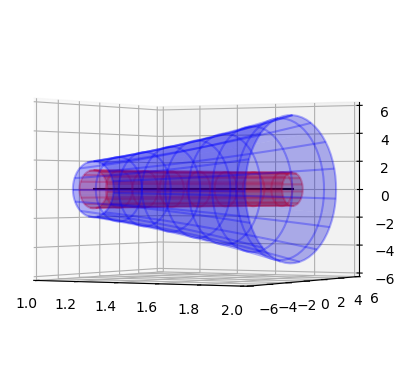

In [23]:
Washer3D2(fn,gn,1,2,-1)

#### Example 2

We already know how to convert SymPy function into NumPy one. However, at this point it is not possible to do the opposite unless you use complicated for-loops. This is the main reason why we always start with defining SymPy function first. Unfortunatelly, sometimes we need to do this. The most common place for this to happen for us is in the modelling problems, since there we start with polynomial from NumPy. The most convient approach for us will be just rewritting polynomial in SymPy.

For example, let $f(x)=x^2+1$. Let's start with NumPy Polynomial and try to find lenght of the curve between $x=1$ and $x=2$.

In [14]:
f=Polynomial([1,0,1])
f

Polynomial([1., 0., 1.], domain=[-1,  1], window=[-1,  1], symbol='x')

We can't use square root on Polynomial type because it will no longer be polynomial. So, we need to convert it to SymPy before we can integrate:

In [15]:
fs=1+x**2

ans=sp.integrate(sp.sqrt(1+fs.diff(x)**2),(x,1,2))
ans

-sqrt(5)/2 - asinh(2)/4 + asinh(4)/4 + sqrt(17)

In [16]:
sp.N(ans)

3.16784090488834

#### Extra Optional Pieces of Code

The code in this part is completely optional. If you want to play more with Python you can try this.

Here I will use a new library called Plotly to generate interactive 3D picture of our surface. Code is a bit complicated, but it is easy to manipulate. On top, you can change inner $f$ and outer $g$ functions and the interval $[a,b]$. Then run the code. It might take a minute to generate the figure, so be patient.

After the surface is generated, you can freely rotate it, zoom in and out, etc.

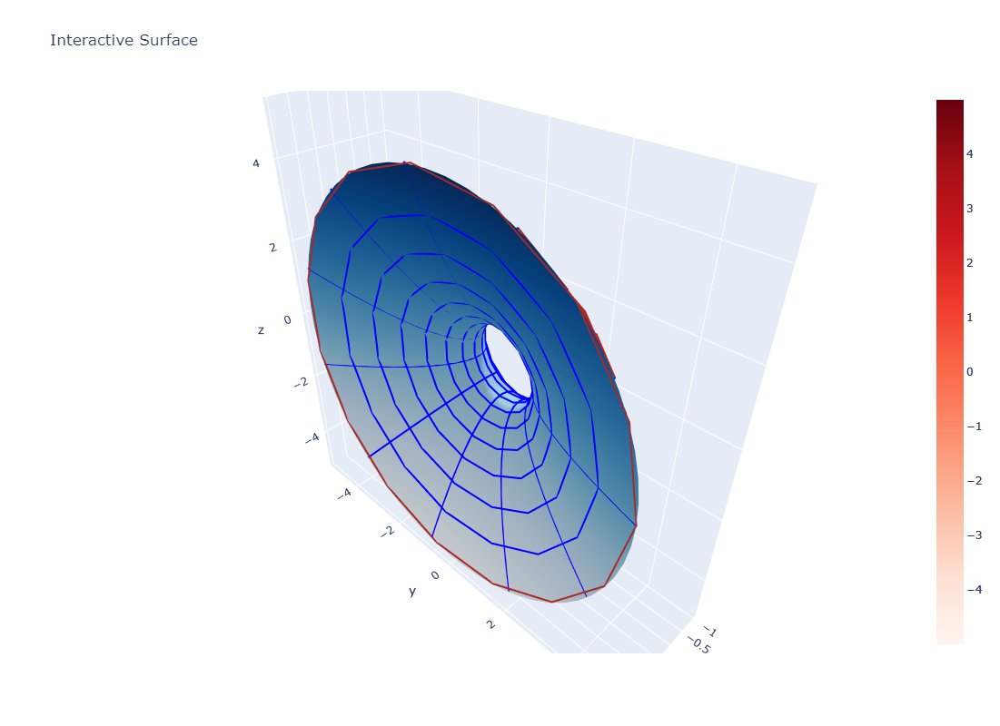

In [33]:
import plotly.graph_objects as go

##################
## Inner Function
f= lambda x: x**2+1
## Outer Function
g= lambda x: x+3
## Interval
a=-1
b=2
##################


## Generating both surfaces
u = np.linspace(a, b, 60)
v = np.linspace(0, 2*np.pi, 60)
U, V = np.meshgrid(u, v)

X = U
Y1 = f(U)*np.cos(V)
Z1 = f(U)*np.sin(V)
Y2 = g(U)*np.cos(V)
Z2 = g(U)*np.sin(V)


fig = go.Figure(data=[go.Surface(z=Z1, x=U, y=Y1, opacity=1, colorscale='blues'),
                      go.Surface(z=Z2, x=U, y=Y2, opacity=0.7, colorscale='reds')])


### Generating longtitudal lines.   
u = np.linspace(a, b, 16)
v = np.linspace(0, 2*np.pi, 12)
U, V = np.meshgrid(u, v)

X = U
Y1 = f(U)*np.cos(V)
Z1 = f(U)*np.sin(V)
Y2 = g(U)*np.cos(V)
Z2 = g(U)*np.sin(V)

line_marker1 = dict(color='blue', width=4)
line_marker2 = dict(color='brown', width=4)
for xx, yy, zz in zip(X, Y1, Z1+0.03):
    fig.add_scatter3d(x=xx, y=yy, z=zz, mode='lines', line=line_marker1, name='') 
for xx, yy, zz in zip(X, Y2, Z2+0.03):
    fig.add_scatter3d(x=xx, y=yy, z=zz, mode='lines', line=line_marker2, name='')     


### Generating latitudal lines.
V,U = np.meshgrid(U,V)
U=U/(2*np.pi)*(b-a)+a
V=V*(2*np.pi)/(b-a)
X = U
Y1 = f(U)*np.cos(V)
Z1 = f(U)*np.sin(V)
Y2 = g(U)*np.cos(V)
Z2 = g(U)*np.sin(V)


for xx, yy, zz in zip(X, Y1, Z1+0.03):
    fig.add_scatter3d(x=xx, y=yy, z=zz, mode='lines', line=line_marker1, name='') 
for xx, yy, zz in zip(X, Y2, Z2+0.03):
    fig.add_scatter3d(x=xx, y=yy, z=zz, mode='lines', line=line_marker2, name='') 
    
fig.update_layout(title='Interactive Surface', autosize=True,
                  width=800, height=800, showlegend=False)
fig.show()